# Functions and libraries

In [1]:
import pandas as pd
import numpy as np
from scipy.io import loadmat

import matplotlib.pyplot
import mne
import scipy
from numpy.core._multiarray_umath import ndarray
from scipy.signal import butter, lfilter, cheby1
import itertools

In [2]:

def mateeg(dane, czestotliwosc, elektrody):
    """Wczytanie danych
    Args:
        dane: wskazanie pliku mat z danymi
        czestotliwosc: ręcznie podana częstotliwość [Hz]
        elektrody: wskazanie pliku csv z nazwami elektrod
    Returns:
        chs: list of channel names
        fs: sampling frequency in [Hz]
        data: EEG data as numpy.array (samples x channels)
    """
    channels = pd.read_csv(elektrody, header=None)
    chs = list(channels.iloc[:,1])
    
    fs=czestotliwosc

    mat = loadmat(dane)
    eeg = mat.get('eeg')
    df= pd.DataFrame(data=eeg)
    data_raw = np.asarray(df.transpose())
    
    return(chs, fs, data_raw)

In [3]:
def osoba_badana(kolejnosc, numer):
    """Wczytanie danych o kolejnosci
    Args:
        kolejnosc: plik csv z kolejnoscia nagrań
        numer: numer osoby badanej
    Returns:
        markery: data frame z nazwa nagrania (kolejno) i numerem osoby badanej
    """
    markery = pd.read_csv(kolejnosc, header=0)
    markery = markery.iloc[:,:2]
    markery['Zadanie'] = markery['Zadanie'].str.replace(r'.wav$', '')
    markery = markery.rename(columns = {'Nr osoby': 'Nr_osoby'})
    markery['Zadanie'] = markery['Zadanie'].replace(to_replace=dict(Squats = 'Przysiady' , Training_Session = 'Trening',
                                                                Your_Home_Venue = 'MiejsceTreningu',
                                                                Successful_Competition = 'WygraneZawody',
                                                                Fitness_Activity = 'AktywnoscRuchowa',
                                                                Slow_Start = 'KiepskiPoczatek',
                                                                Start_high_level_championship = 'StartZawody'),
                                                                inplace=False)
    markery['Nr_osoby'] = markery['Nr_osoby'].str[1:]
    markery['Nr_osoby'] = pd.to_numeric(markery['Nr_osoby'], downcast = 'integer')
    markery = markery[markery['Nr_osoby'] == numer]
    return(markery)
    

In [4]:
def load_markers(markery, dataframe, fs, timestamp):
    """Wczytanie danych o rozpoczeciu nagran
    Args:
        markery: plik mat z czasem markerów
        dataframe: dataframe otrzymany z funkcji osoba_badana
        fs: sampling frequency [Hz]
        timestamp: czas oznaczany przed nagraniami i po wyobrażaniu
    Returns:
        dataframe: dataframe z nazwa nagrania i czasami
    """
    d = get_timings()
    
    marker = loadmat(markery)
    marker = marker.get('marker').T
    marker = list(np.concatenate(marker).flat)
    marker = np.asarray(marker)
    marker = sorted(marker)
    dataframe.insert(1, "Start_Time", marker, True)
    dataframe = dataframe.iloc[:,:2]
    
    dataframe["Recording_Time"] = dataframe["Zadanie"].apply(lambda x: d.get(x))
    
    dataframe["End_Time"] = dataframe["Start_Time"] + (dataframe["Recording_Time"]*fs)
    
    dataframe["End_2s"] = dataframe["End_Time"] + (2*fs)
    
    dataframe["Imagine"] = dataframe["End_2s"] + (60*fs)
    
    #timestampy
    
    dataframe["Before_Recording_Time"] = dataframe["Start_Time"] - (timestamp*fs)
    
    dataframe["After_Imagine_Time"] = dataframe["Imagine"] + (timestamp*fs)
    
    return(dataframe)

In [5]:
def eeg_split(data, dataframe, cut=1, cut_split = True):
    """Dzieli i wybiera część która chcemy badać
    Args:
        data:  uncut EEG data as numpy.array (samples x channels)
        dataframe: data frame z funkcji load_markers
        cut: ucina część sygnału, 0 - brak cięcia, 1 - ucina do momentu pierwszego nagrania, 2 - do momentu drugiego itd.
        cut_split: ucina te same częśći z eksperymentów
    Returns:
        data: choosen part of EEG data as numpy.array (samples x channels)
        datal: listening part of EEG data as numpy.array (samples x channels)
        datai: imagination part of EEG data as numpy.array (samples x channels)
    """
    cut1 = np.asarray(dataframe["Start_Time"])
    cut2 = np.asarray(dataframe["End_Time"])
    cut3 = np.asarray(dataframe["End_2s"])
    cut4 = np.asarray(dataframe["Imagine"])
    datal = []
    datai = []
    
    for ciach in range(len(cut1)):
        dataciach = pd.DataFrame(data)
        dataciach = dataciach.iloc[cut1[ciach]:cut2[ciach],:]
        dataciach = np.asarray(dataciach)
        dataciach = [dataciach]
        dataciach = list(dataciach)
        datal = datal + dataciach
    datal=datal
    
    for ciach in range(len(cut1)):
        dataciach = pd.DataFrame(data)
        dataciach = dataciach.iloc[cut3[ciach]:cut4[ciach],:]
        dataciach = np.asarray(dataciach)
        dataciach = [dataciach]
        dataciach = list(dataciach)
        datai = datai + dataciach
    datai=datai
    
    if (cut == 0):
        data = data
    else:
            data = pd.DataFrame(data)
            data = data.iloc[cut1[cut-1]:,:]
    
    if (cut_split == True):
        
        del datal[:(cut-1)] 
        del datai[:(cut-1)] 
    else:
        datal=datal
        datai=datai
    datal = np.asarray(list(itertools.chain(*datal)))
    datai = np.asarray(list(itertools.chain(*datai)))
    
    return(data, datal, datai)

In [42]:
def multi_plot(data, dataframe, fs, ymin, ymax, chs, markery = True):
    """Plot the data for every/single/choosen electrode
    Args:
        data: numpy.array
        fs: sampling frequency [Hz]
        chs: list of channel names
        ymin: y min value
        ymax: y max value
        dataframe: data frame z funkcji load_markers
        markery: czy zaznaczyć markery na wykresach
    """
    t = np.arange(len(data))/fs # time axis in seconds
    data =data.T
    
    start = pd.DataFrame(dataframe['Start_Time'])
    start=start.reset_index()
    start=list(start.iloc[:,1])
    
    end = pd.DataFrame(dataframe['End_Time'])
    end=end.reset_index()
    end=list(end.iloc[:,1])
    
    twos = pd.DataFrame(dataframe['End_2s'])
    twos=twos.reset_index()
    twos=list(twos.iloc[:,1])
    
    imagine = pd.DataFrame(dataframe['Imagine'])
    imagine=imagine.reset_index()
    imagine=list(imagine.iloc[:,1])
    
    for wykres in range(len(chs)):
        fig = plt.figure(1, figsize=(20,4))
        plt.plot(t, data[wykres], '-k', linewidth=1)
        plt.xlabel("time [s]", fontsize=24)
        plt.ylabel("potential [$\mu$V]", fontsize=24)
        plt.tight_layout()
        plt.ylim((ymin,ymax))
        plt.title(chs[wykres], fontsize = 30)
        if (markery == True):
            for marker in range(len(start)):
                plt.plot([start[marker]/fs, start[marker]/fs], [ymin, ymax], 'g-', lw=2)
                plt.plot([end[marker]/fs, end[marker]/fs], [ymin, ymax], 'r-', lw=2)
                plt.plot([twos[marker]/fs, twos[marker]/fs], [ymin, ymax], 'y-', lw=2)
                plt.plot([imagine[marker]/fs, imagine[marker]/fs], [ymin, ymax], 'b-', lw=2)
        
        plt.show()
    if (markery == True):
        print("Kolor zielony - początek nagrania, czerwony - koniec nagrania")
        print("Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania")

In [43]:
def plot_data(data, fs, ymin, ymax, dataframe, markery = True):
    """Plot the data with markers
    Args:
        data: numpy.array
        fs: sampling frequency [Hz]
        ymin: y min value
        ymax: y max value
        dataframe: data frame z funkcji load_markers
        markery: czy zaznaczyć markery na wykresach
    """
    t = np.arange(len(data))/fs # time axis in seconds
    fig = plt.figure(1, figsize=(20,4))
    plt.plot(t, data, '-k', linewidth=1)
    plt.xlabel("time [s]", fontsize=24)
    plt.ylabel("potential [$\mu$V]", fontsize=24)
    plt.tight_layout()
    plt.ylim((ymin,ymax))
    
    start = pd.DataFrame(dataframe['Start_Time'])
    start=start.reset_index()
    start=list(start.iloc[:,1])
    
    end = pd.DataFrame(dataframe['End_Time'])
    end=end.reset_index()
    end=list(end.iloc[:,1])
    
    twos = pd.DataFrame(dataframe['End_2s'])
    twos=twos.reset_index()
    twos=list(twos.iloc[:,1])
    
    imagine = pd.DataFrame(dataframe['Imagine'])
    imagine=imagine.reset_index()
    imagine=list(imagine.iloc[:,1])
    
    if (markery == True):
        for marker in range(len(start)):
            plt.plot([start[marker]/fs, start[marker]/fs], [ymin, ymax], 'g-', lw=2)
            plt.plot([end[marker]/fs, end[marker]/fs], [ymin, ymax], 'r-', lw=2)
            plt.plot([twos[marker]/fs, twos[marker]/fs], [ymin, ymax], 'y-', lw=2)
            plt.plot([imagine[marker]/fs, imagine[marker]/fs], [ymin, ymax], 'b-', lw=2)
    
    plt.show()
    if (markery == True):
        print("Kolor zielony - początek nagrania, czerwony - koniec nagrania")
        print("Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania")

In [8]:
def read_xyz(koordynaty):
    """Wczytanie danych
    Args:
        dane: plik csv z koordynatami elektrod
    Returns:
        ch_names: nazwy elektrod dla podanych koordynatów
        array z koordynatami dla każdej elektrody
    """
    kordy = pd.read_csv(koordynaty, header=0)
    kordy = kordy.iloc[:,:4]

    kordy_name = list(kordy.iloc[:,0])

    set1=set(kordy_name)
    set2=set(chs)
    wspolne = set1.intersection(set2)

    kordy1 = kordy[kordy.Electrode_name.isin(wspolne)]

    ch_names=list(kordy1.iloc[:,0])
    
    kordy11=kordy1.drop(columns=['Electrode_name'])
    
    return(ch_names, np.array(kordy11))

In [9]:
def get_frequency_bands() -> dict:
    """
    Returns frequency bands
    :return: dictionary with frequency bands
    """
    return {
        'theta': (4, 8),
        'low alpha': (8, 10),
        'high alpha': (10, 12),
        'alpha': (8, 12),
        'SMR': (12, 15),
        'low beta': (15, 23),
        'high beta': (23, 30),
        'beta': (15, 30)
    }

In [10]:
#długość nagrań
def get_timings() -> dict:
    """
    Returns timing in seconds of particular recording related to the name of the task
    :return: dictionary with timings in seconds
    """
    return {
        'Przysiady': 27,
        'WygraneZawody': 38,
        'AktywnoscRuchowa': 37,
        'KiepskiPoczatek': 47,
        'StartZawody': 33,
        'Trening': 37,
        'MiejsceTreningu': 40
    }

In [11]:
def find_neighbours(info: mne.Info, k: int) -> dict:
    """ Returns n-neighbours of given electrodes (MNE package required)
    :param info: mne.Info. See generate_info for more information
    :param k: int. The count of neighbour
    :return neighbours: dict. A dictionary with k-nearest neighbours based on mne.Info object
    """
    neighbours = {}
    cords = []
    ch_names = []

    for electrode in info['chs']:
        cords.append(electrode['loc'][:2])
        ch_names.append(electrode['ch_name'])
    cords = np.array(cords)

    tree = scipy.spatial.cKDTree(cords, leafsize=100)
    for item in cords:
        result = tree.query(item, k=k + 1, distance_upper_bound=6)
        result = list(map(lambda x: str(ch_names[x]), result[1]))
        neighbours[result[0]] = result[1:]
    return neighbours


def get_neighbors_for_hjorth() -> dict:
    """
    Returns neighbors of electrodes
    :return: dictionary with all electrodes neighbors
    """
    
    return {
        'Fp1': ['F3', 'Fz'],
        'Fp2': ['F4', 'Fz'],
        'F3': ['Fp1', 'FC5', 'FC1', 'Fz'],
        'Fz': ['Fp1', 'Fp2', 'F3', 'F4', 'FC1', 'FCz', 'FC2'],
        'F4': ['Fp2', 'FC6', 'FC2', 'Fz'],
        'FC5': ['F3', 'FC1', 'C3', 'C5', 'T7'],
        'FC1': ['F3', 'Fz', 'FCz', 'Cz', 'C1', 'C3', 'FC5'],
        'FCz': ['Fz', 'FC2', 'C2', 'Cz', 'C1', 'FC1'],
        'FC2': ['Fz', 'F4', 'FC6', 'C4', 'C2', 'Cz', 'FCz'],
        'FC6': ['F4', 'T8', 'C6', 'C4', 'FC2'],
        'T7': ['FC5', 'C5', 'CP5'],
        'C5': ['FC5', 'C3', 'CP5', 'T7'],
        'C3': ['FC5', 'FC1', 'C1', 'CP1', 'CP5', 'C5'],
        'C1': ['FC1', 'FCz', 'Cz', 'CPz', 'CP1', 'C3'],
        'Cz': ['FC1', 'FCz', 'FC2', 'C2', 'CP2', 'CPz', 'CP1', 'C1'],
        'C2': ['FCz', 'FC2', 'C4', 'CP2', 'CPz', 'Cz'],
        'C4': ['FC2', 'FC6', 'C6', 'CP6', 'CP2', 'C2'],
        'C6': ['FC6', 'T8', 'CP6', 'C4'],
        'T8': ['FC6', 'C6', 'CP6'],
        'CP5': ['T7', 'C5', 'C3', 'CP1', 'P3'],
        'CP1': ['C3', 'C1', 'Cz', 'CPz', 'Pz', 'P3', 'CP5'],
        'CPz': ['C1', 'Cz', 'C2', 'CP2', 'Pz', 'CP1'],
        'CP2': ['Cz', 'C2', 'C4', 'CP6', 'P4', 'Pz', 'CPz'],
        'CP6': ['C4', 'C6', 'T8', 'P4', 'CP2'],
        'P3': ['CP5', 'CP1', 'Pz', 'PO7'],
        'Pz': ['CP1', 'CPz', 'CP2', 'P4', 'Oz', 'P3'],
        'P4': ['CP2', 'CP6', 'PO8', 'Pz'],
        'PO7': ['P3', 'Oz'],
        'PO8': ['P4', 'Oz'],
        'Oz': ['PO7', 'Pz', 'PO8']
    }


def surface_laplacian(data: ndarray, neighbours: dict, electrodes: list) -> ndarray:
    """ Surface Laplacian transformation aka. Hjorth method
    :param data: ndarray. Array with the signal
    :param neighbours: dict. Dictionary with the nearest neighbours. See find_neighbours() for more info
    :param electrodes: list. List with electrode names
    :return:  filtered_signal: ndarray. Filtered array with the signal
    """
    
    df_raw = pd.DataFrame(np.array(data), columns=[_ for _ in electrodes])
    #print(df_raw)
    
    filtered_signal = []

    for electrode in electrodes:
        #filtered_signal.append(
        #    df[electrode].values * (1 / len(neighbours[electrode]) * (df[neighbours[electrode]].values.sum(axis=1))))
        #print(df_raw[electrode].values)
        #print(1 / len(neighbours()[electrode]) * (df_raw[neighbours()[electrode]].values.sum(axis=1)))
        filtered_signal.append(df_raw[electrode].values - (1 / len(neighbours()[electrode]) * (df_raw[neighbours()[electrode]].values.sum(axis=1))))

    #for i, electrode in enumerate(electrodes):
    #    df[electrode] = filtered_signal[i]
    return filtered_signal





def butter_bandpass_filter(data: ndarray, lowcut: int, highcut: int, fs: int, order: int = 5) -> ndarray:
    """
    Returns filtered signal
    :param data: data array to be filtered
    :param lowcut: the lowest cut-off point frequency for the filter
    :param highcut: the highest cut-off point frequency for the filter
    :param fs: frequency sampling rate
    :param order: an order of filter
    :return: array with the filtered signal
    """
    def butter_bandpass(lowcut: int, highcut: int, fs: int, order: int = 5) -> object:
        """
        Returns parameters for butterworth filter
        :param lowcut: the lowest cut-off point frequency for the filter
        :param highcut: the highest cut-off point frequency for the filter
        :param fs: frequency sampling rate
        :param order: an order of filter
        :return: parameters for the filter
        """
        nyq = 0.5 * fs
        low = lowcut / nyq
        high = highcut / nyq
        b, a = butter(order, [low, high], btype='band')
        return b, a

    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y



In [12]:
def mean_filter(data):
    """Funkcja do filtrowania sygnału EEG przez odjęcie wartości średniej
     Args:
        data: sygnał numpy.array (samples x channels)
    Returns:
        datasum: filtered EEG data as numpy.array (samples x channels)
    """
    dataframe = pd.DataFrame(data)

    for electrode in range(data.shape[1]):
        dataframe[electrode] = dataframe[electrode] - np.mean(dataframe[electrode])
    
    dataframe = np.asarray(dataframe)
    return(dataframe)

In [13]:
def data_filter(data, dataframe, fs, chs, bp = None, hjorth = False, ica = False, mean = False,
                bp_lowcut = 4, bp_highcut = 45, bp_jasik_order = 6, pcaymin = -250, pcaymax = 250, markery = True):
    """Funkcja do filtrowania sygnału EEG
     Args:
        data: sygnał numpy.array (samples x channels)
        fs: ręcznie podana częstotliwość [Hz]
        chs: lista kanałów
        dataframe: data frame z funkcji load_markers
        bp: czy zastosować filtr Butterwortha
        laplace: czy zastosować filtr Hjortha
        ica: czy zastosować filtr ICA
        mean: czy zastosować mean_filter
        bp_lowcut: the lowest cut-off point frequency for the filter
        bp_hightcut: the highest cut-off point frequency for the filter
        bp_order: Butterworth filter order
        markery: czy zaznaczyć markery na wykresach
    Returns:
        data: filtered EEG data as numpy.array (samples x channels)
        pca: filtered data after pca
        pca plot
    """
    if(ica == True):
        print("Filter used: FastICA from sklearn.")
        ica=FastICA(n_components = data.shape[1], random_state = 0)
        data = ica.fit_transform(data)
    else:
        data=data
    
    
    if(bp == "wegner"):
        print("Filter used: Butterworth by dr. Wegner.")
        data = bp_filter(data = data, f_lo=bp_lowcut, f_hi=bp_highcut, fs=fs)

    if(bp == "jasik"):
        print("Filter used: Butterworth by dr. Jasik.")
        data = butter_bandpass_filter(data = data, lowcut =bp_lowcut, highcut = bp_highcut, fs = fs, order = bp_jasik_order)
    else:
        data = data
        
    if(hjorth == True):
        print("Filter used: Hjorth by dr. Jasik.")
        data = np.asarray(surface_laplacian(data, get_neighbors_for_hjorth, chs)).T
    else:
        data=data
        
    if(mean == True):
        print("Filter used: mean_filter by me.")
        data = mean_filter(data)
    else:
        data=data

    pca = PCA(copy=True, n_components=1, whiten=False)
    pca2 = pca.fit_transform(data)[:,0]
    plot_data(pca2, fs, ymin = pcaymin, ymax = pcaymax, dataframe=dataframe, markery = markery)
    

    
    return (data, pca2)

In [72]:
def signal_stats(data1, data2, dataframe, fs, ymin, ymax, chs, markery = True):
    """Funkcja do obliczania podstawowych statystyk dla sygnału
    Args:
    data1: sygnał przed filtracją; numpy.array (samples x channels)
    data2: sygnał po filtracji; numpy.array (samples x channels)
    fs: sampling frequency [Hz]
    chs: list of channel names
    ymin: y min value
    ymax: y max value
    dataframe: data frame z funkcji load_markers
    """
    t = np.arange(len(data1))/fs # time axis in seconds
    data1= data1.T
    data2 = data2.T
    
    if (markery == True):
        start = pd.DataFrame(dataframe['Start_Time'])
        start=start.reset_index()
        start=list(start.iloc[:,1])
    
        end = pd.DataFrame(dataframe['End_Time'])
        end=end.reset_index()
        end=list(end.iloc[:,1])
    
        twos = pd.DataFrame(dataframe['End_2s'])
        twos=twos.reset_index()
        twos=list(twos.iloc[:,1])
    
        imagine = pd.DataFrame(dataframe['Imagine'])
        imagine=imagine.reset_index()
        imagine=list(imagine.iloc[:,1])
    
    for wykres in range(len(chs)):
        fig = plt.figure(1, figsize=(20,4))
        plt.plot(t, data1[wykres], '-k', linewidth=1)
        plt.plot(t, data2[wykres], '-m', linewidth=1)
        plt.xlabel("time [s]", fontsize=24)
        plt.ylabel("potential [$\mu$V]", fontsize=24)
        plt.tight_layout()
        plt.ylim((ymin,ymax))
        plt.title(chs[wykres], fontsize = 30)
        if (markery == True):
            for marker in range(len(start)):
                plt.plot([start[marker]/fs, start[marker]/fs], [ymin, ymax], 'g-', lw=2)
                plt.plot([end[marker]/fs, end[marker]/fs], [ymin, ymax], 'r-', lw=2)
                plt.plot([twos[marker]/fs, twos[marker]/fs], [ymin, ymax], 'y-', lw=2)
                plt.plot([imagine[marker]/fs, imagine[marker]/fs], [ymin, ymax], 'b-', lw=2)
        
        plt.show()
    
    if (markery == True):
        print("Kolor zielony - początek nagrania, czerwony - koniec nagrania")
        print("Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania")
    
    staty = pd.DataFrame([])
    staty['Electrode'] = chs
    mean1 = []
    mean2 = []
    std1 = []
    std2 = []
    var1 = []
    var2 = []
    print("Stats")
    for stat in range(len(chs)):
        mean1.append(np.mean(data1[stat]))
        mean2.append(np.mean(data2[stat]))
        std1.append(np.std(data1[stat]))
        std2.append(np.std(data2[stat]))
        var1.append(np.var(data1[stat]))
        var2.append(np.var(data2[stat]))
    staty['Mean_Before'] = mean1
    staty['Mean_After'] = mean2
    staty['Std_Before'] = std1
    staty['Std_After'] = std2
    staty['Var_Before'] = var1
    staty['Var_After'] = var2
    staty = pd.DataFrame(staty)
    display(staty)

In [14]:
def make_clusters(data, fs, chs, n_maps = 4, locs=[]):
    """Funkcja do tworzenia map mikrostanów
    Args:
    data: sygnał numpy.array (samples x channels)
    fs: ręcznie podana częstotliwość [Hz]
    chs: lista kanałów
    mode: metoda klasteryzacji spośród ["kmeans", "kmedoids", "pca", "ica"]
    n_maps: liczba map stworzonych mikrostanów
    locs: numpy.array (n_ch, 2) of electrode locations (x, y)
    Returns:
    maps: n_maps x n_channels NumPy array
    L: microstate sequence (integers)
    gfp_peaks: locations of local GFP maxima
    gev: global explained variance
    """
    #mode: metoda klasteryzacji spośród ["kmeans", "kmedoids", "pca", "ica"]
    print("Wybierz metodę klasteryzacji spośród [kmeans, kmedoids, pca, ica]")
    print( "Except = kmeans")
    try:
        mode = str(input("Podaj metodę klasteryzacji: "))
    except:
        mode = 'kmeans'
    maps, x, gfp_peaks, gev = clustering(data, fs, chs, locs, mode = mode, n_clusters = n_maps, doplot=True)
    return(maps, x, gfp_peaks, gev)

In [15]:
def stats(x, gfp_peaks, fs, n_maps = 4, alpha = 0.01):
    p_hat = p_empirical(x, n_maps)
    T_hat = T_empirical(x, n_maps)
    print("\nEmpirical symbol distribution (RTT):\n")
    for i in range(n_maps):
        print(f"p_{i:d} = {p_hat[i]:.3f}")
    print("\nEmpirical transition matrix:\n")
    print_matrix(T_hat)
    pps = len(gfp_peaks) / (len(x)/fs)  # peaks per second
    print(f"\nGFP peaks per sec.: {pps:.2f}")
    print("\nGlobal explained variance (GEV) per map:")
    for i, g in enumerate(gev): print(f"GEV(ms-{i:d}) = {gev[i]:.2f}")
    print(f"\ntotal GEV: {gev.sum():.3f}")
    

    h_hat = H_1(x, n_maps)
    h_max = max_entropy(n_maps)
    print(f"\nEmpirical entropy H = {h_hat:.2f} (max. entropy: {h_max:.2f})")

    h_rate, _ = excess_entropy_rate(x, n_maps, kmax=8, doplot=True)
    h_mc = mc_entropy_rate(p_hat, T_hat)
    print(f"\nEmpirical entropy rate h = {h_rate:.2f}")
    print(f"Theoretical MC entropy rate h = {h_mc:.2f}")
    
    
    alpha = alpha
    p_M0 = testMarkov0(x, n_maps, alpha)
    p_M1 = testMarkov1(x, n_maps, alpha)
    p_M2 = testMarkov2(x, n_maps, alpha)
    p_vals_geo = geoTest(x, n_maps, 1000./fs, alpha)
    
    try:
        L = int(input("Enter block size: "))
    except:
        L = 5000
    p3 = conditionalHomogeneityTest(x, n_maps, L, alpha)
    
    
    p4 = symmetryTest(x, n_maps, alpha)

In [16]:
def T_empirical(data, n_clusters):
    """Empirical transition matrix
    Args:
        data: numpy.array, size = length of microstate sequence
        n_clusters: number of microstate clusters
    Returns:
        T: empirical transition matrix
    """
    T = np.zeros((n_clusters, n_clusters))
    n = len(data)
    for i in range(n-1):
        T[data[i], data[i+1]] += 1.0
    p_row = np.sum(T, axis=1)
    for i in range(n_clusters):
        if ( p_row[i] != 0.0 ):
            for j in range(n_clusters):
                T[i,j] /= p_row[i]  # normalize row sums to 1.0


    
    
    return T

In [17]:
def Stochastic_Matrix(data, n_clusters):
    """Empirical transition matrix
    Args:
        data: numpy.array, size = length of microstate sequence
        n_clusters: number of microstate clusters
    Returns:
        T: empirical transition matrix
    """
    T = np.zeros((n_clusters, n_clusters))
    n = len(data)
    for i in range(n-1):
        T[data[i], data[i+1]] += 1.0
    p_row = np.sum(T, axis=1)
    for i in range(n_clusters):
        if ( p_row[i] != 0.0 ):
            for j in range(n_clusters):
                T[i,j] /= p_row[i]  # normalize row sums to 1.0
    T= pd.DataFrame(T)

    
    
    return T

# Koniec wczytywania pakietów i definiowania funkcji

In [18]:
# Wczytanie danych
chs, fs, data_raw = mateeg('data28_eeg.mat',250,'Elektrody_legenda.csv')

In [19]:
# Wgląd w poprawność wczytanych danych
print("\tSampling rate: {:.2f} Hz".format(fs))
print("\tData shape: {:d} samples x {:d} channels".format(data_raw.shape[0], data_raw.shape[1]))
print("\tChannels:")
print("Channels:")
chs

	Sampling rate: 250.00 Hz
	Data shape: 246352 samples x 30 channels
	Channels:
Channels:


['Fp1',
 'Fp2',
 'F3',
 'Fz',
 'F4',
 'FC5',
 'FC1',
 'FCz',
 'FC2',
 'FC6',
 'T7',
 'C5',
 'C3',
 'C1',
 'Cz',
 'C2',
 'C4',
 'C6',
 'T8',
 'CP5',
 'CP1',
 'CPz',
 'CP2',
 'CP6',
 'P3',
 'Pz',
 'P4',
 'PO7',
 'PO8',
 'Oz']

In [20]:
# Wczytujemy dany o przeprowadzanym badaniu dla osoby 28
ob = osoba_badana('OrderSport.csv', 28)
ob

C:\Users\Kacper\AppData\Local\Temp/ipykernel_6344/2352583332.py:11: FutureWarning: The default value of regex will change from True to False in a future version.
  markery['Zadanie'] = markery['Zadanie'].str.replace(r'.wav$', '')


,Zadanie,Nr_osoby
189,Przysiady,28
190,Trening,28
191,MiejsceTreningu,28
192,WygraneZawody,28
193,AktywnoscRuchowa,28
194,KiepskiPoczatek,28
195,StartZawody,28


In [21]:
# Wczytujemy momenty rozpoczecia nagran
timing = load_markers('data28_marker.mat', ob, fs=fs, timestamp=5)
timing

,Zadanie,Start_Time,Recording_Time,End_Time,End_2s,Imagine,Before_Recording_Time,After_Imagine_Time
189,Przysiady,31521,27,38271,38771,53771,30271,55021
190,Trening,61225,37,70475,70975,85975,59975,87225
191,MiejsceTreningu,92449,40,102449,102949,117949,91199,119199
192,WygraneZawody,124673,38,134173,134673,149673,123423,150923
193,AktywnoscRuchowa,156040,37,165290,165790,180790,154790,182040
194,KiepskiPoczatek,187240,47,198990,199490,214490,185990,215740
195,StartZawody,220018,33,228268,228768,243768,218768,245018


In [ ]:
def load_markers(markery, dataframe, fs, timestamp):
    """Wczytanie danych o rozpoczeciu nagran
    Args:
        markery: plik mat z czasem markerów
        dataframe: dataframe otrzymany z funkcji osoba_badana
        fs: sampling frequency [Hz]
        timestamp: czas oznaczany przed nagraniami i po wyobrażaniu
    Returns:
        dataframe: dataframe z nazwa nagrania i czasami
    """
    d = get_timings()
    
    marker = loadmat(markery)
    marker = marker.get('marker').T
    marker = list(np.concatenate(marker).flat)
    marker = np.asarray(marker)
    marker = sorted(marker)
    dataframe.insert(1, "Start_Time", marker, True)
    dataframe = dataframe.iloc[:,:2]
    
    dataframe["Recording_Time"] = dataframe["Zadanie"].apply(lambda x: d.get(x))
    
    dataframe["End_Time"] = dataframe["Start_Time"] + (dataframe["Recording_Time"]*fs)
    
    dataframe["End_2s"] = dataframe["End_Time"] + (2*fs)
    
    dataframe["Imagine"] = dataframe["End_2s"] + (60*fs)
    
    #timestampy
    
    dataframe["Before_Recording_Time"] = dataframe["Start_Time"] - (timestamp*fs)
    
    dataframe["After_Imagine_Time"] = dataframe["Imagine"] + (timestamp*fs)
    
    return(dataframe)

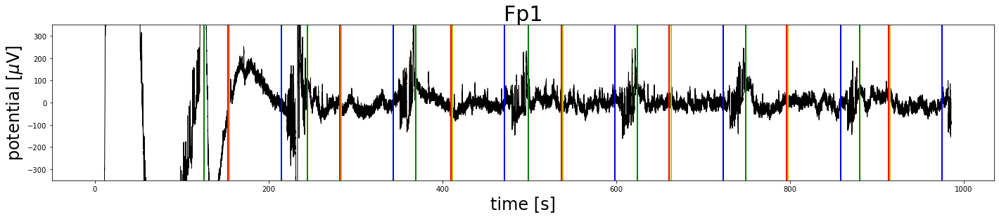

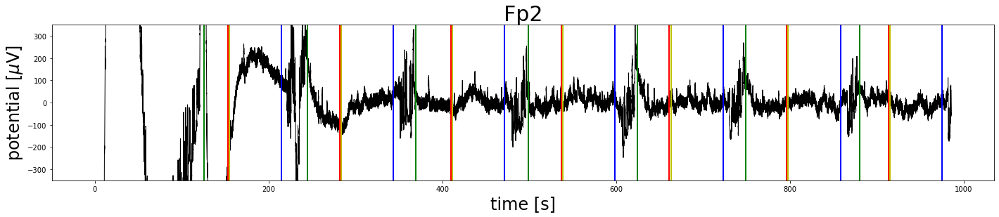

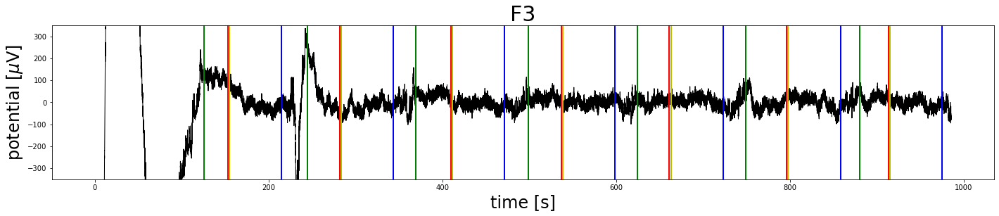

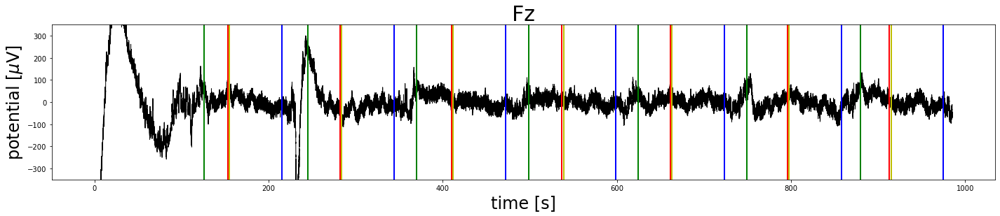

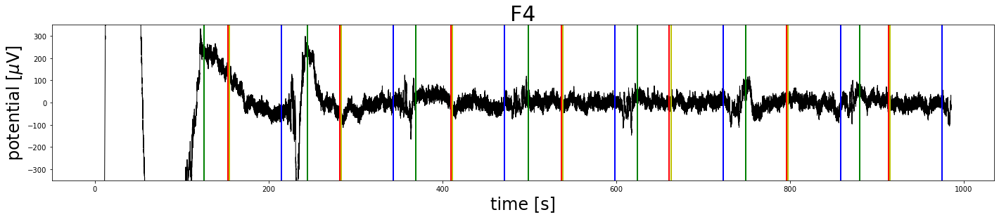

...

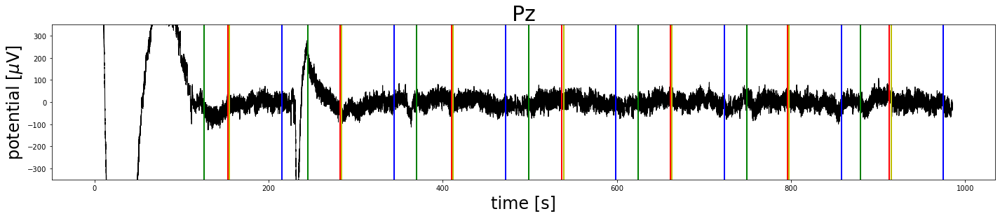

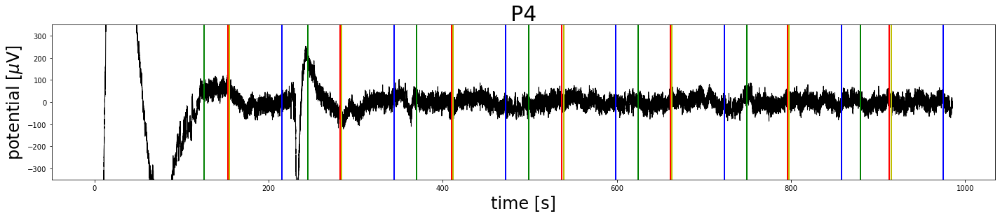

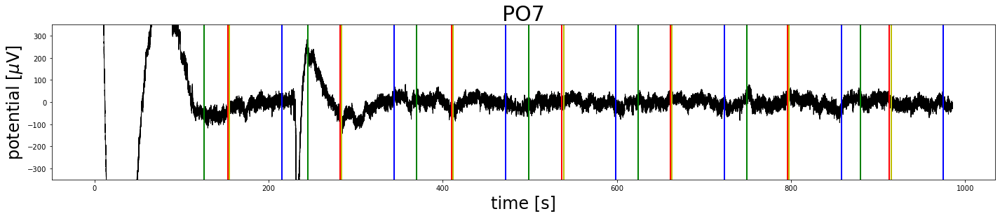

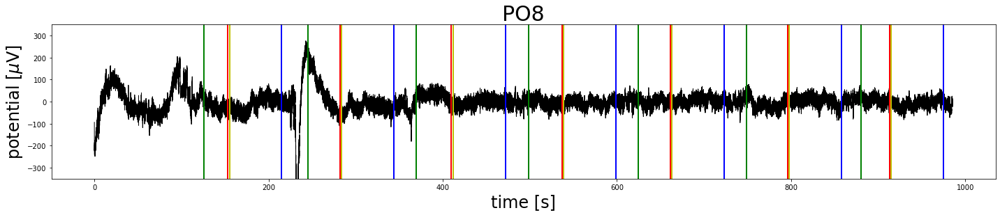

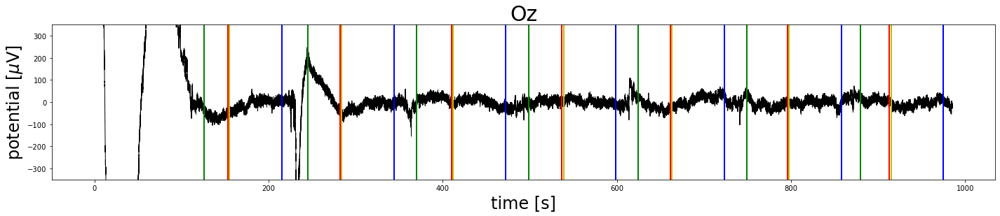

Kolor zielony - początek nagrania, czerwony - koniec nagrania
Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania


In [22]:
multi_plot(data=data_raw, fs=fs,ymin=-350, ymax=350, dataframe= timing, chs=chs)

## Testy na filtrze butterwortha -> PCA
1. Filtr zaproponowany przez Dr. Wegnera
2. Filtr zdefiniowany przez Dr. Jasika (scipy)

(246352, 30)


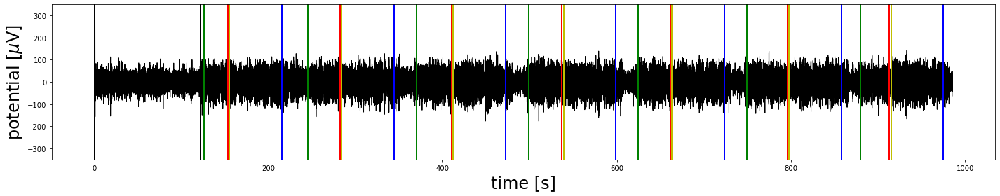

Kolor zielony - początek nagrania, czerwony - koniec nagrania
Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania


In [23]:
# 1. 6-th order
data_raw2 = bp_filter(data_raw, f_lo=4, f_hi=45, fs=fs)
print(data_raw2.shape)


pca = PCA(copy=True, n_components=1, whiten=False)
pca2 = pca.fit_transform(data_raw2)[:,0]
plot_data(pca2, fs,-350, 350, timing)

(246352, 30)


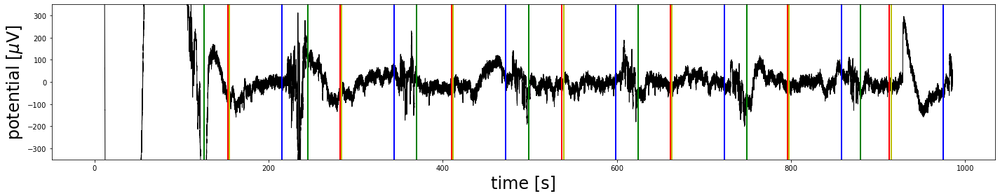

Kolor zielony - początek nagrania, czerwony - koniec nagrania
Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania


In [24]:
#2. 6-th order
data_raw2 = butter_bandpass_filter(data = data_raw, lowcut =4, highcut = 45, fs = fs, order = 6)
print(data_raw2.shape)

pca = PCA(copy=True, n_components=1, whiten=False)
pca2 = pca.fit_transform(data_raw2)[:,0]
plot_data(pca2, fs,-350, 350, timing)

In [25]:
#2. 6-th order
ica=FastICA(n_components = data_raw.shape[1])
data_raw2 = ica.fit_transform(data_raw)
print(data_raw2.shape)
data_raw2

(246352, 30)


array([[-1.25002718e-04,  3.83960155e-03, -3.46404249e-04, ...,
        -2.08519876e-03,  1.57347419e-03,  2.37400947e-04],
       [-6.93870693e-05,  8.62383127e-03, -9.56607502e-04, ...,
        -4.73291838e-03,  3.85463063e-03,  8.48695454e-04],
       [ 9.40776296e-04,  7.70114154e-03, -1.94512569e-03, ...,
        -4.27443619e-03,  5.08242313e-03,  1.43778579e-03],
       ...,
       [ 1.52361506e-03, -1.87597063e-03,  1.54723554e-03, ...,
        -6.38435853e-05,  3.09470553e-03, -3.47677179e-03],
       [ 1.47293307e-03, -2.11578876e-03,  1.55634616e-03, ...,
         3.72534293e-04,  2.95101261e-03, -3.74801438e-03],
       [ 1.38353782e-03, -2.45815636e-03,  1.66563757e-03, ...,
         6.05031861e-04,  2.77050628e-03, -3.79045243e-03]])

In [26]:
data_split, datal, datai = eeg_split(data = data_raw, dataframe = timing, cut = 2, cut_split = True)

# Analiza sygnału ze słuchania datal

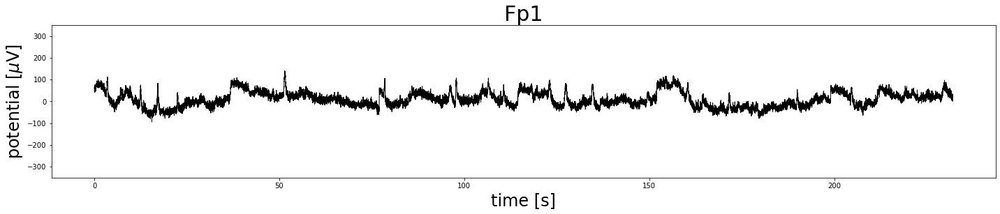

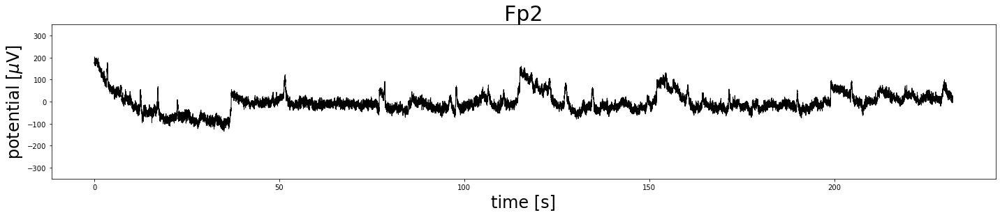

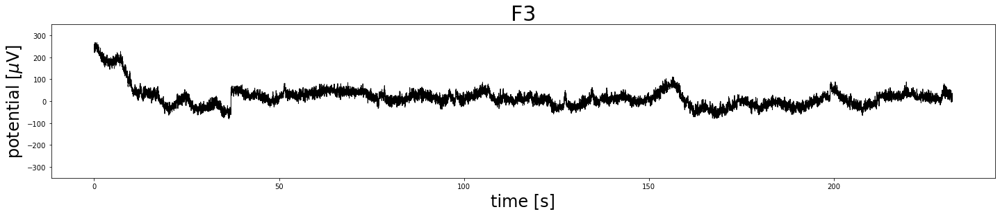

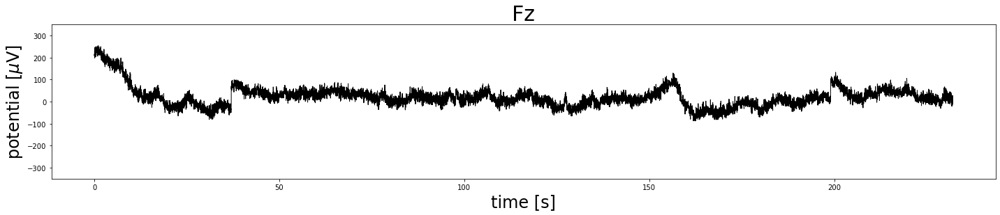

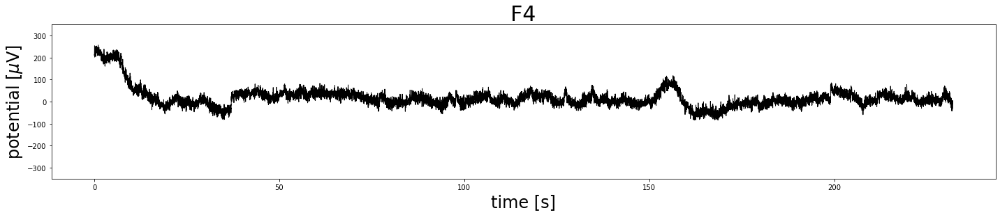

...

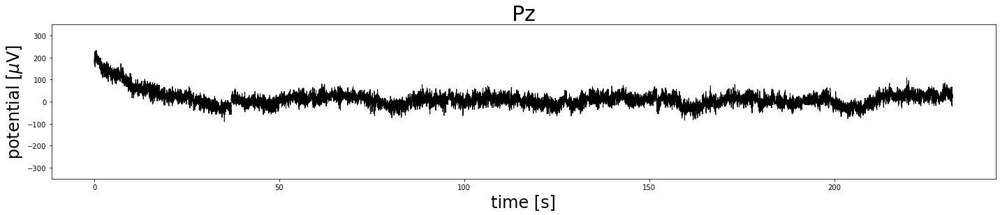

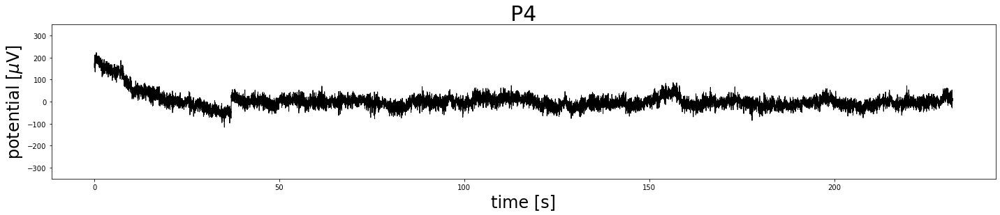

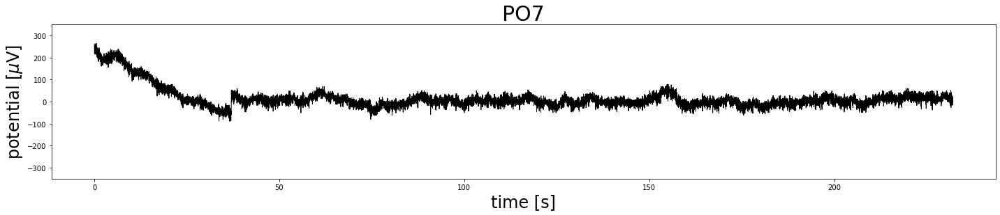

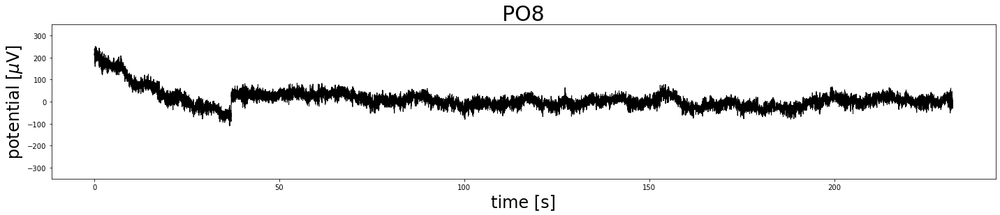

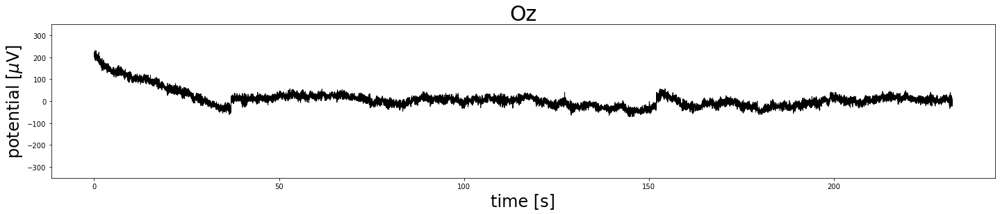

Kolor zielony - początek nagrania, czerwony - koniec nagrania
Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania


In [27]:
multi_plot(data=datal, fs=fs,ymin=-350, ymax=350, dataframe= timing, chs=chs, markery = False)

Filter used: Butterworth by dr. Wegner.
Filter used: Hjorth by dr. Jasik.
Filter used: mean_filter by me.


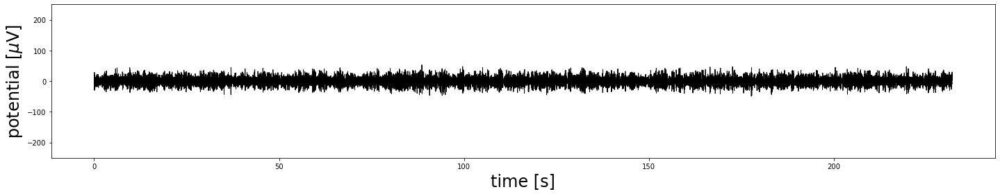

Kolor zielony - początek nagrania, czerwony - koniec nagrania
Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania


In [28]:
danel, pca = data_filter(data = datal, dataframe= timing, fs=fs, chs = chs, bp = "wegner", hjorth = True, mean = True, markery = False)

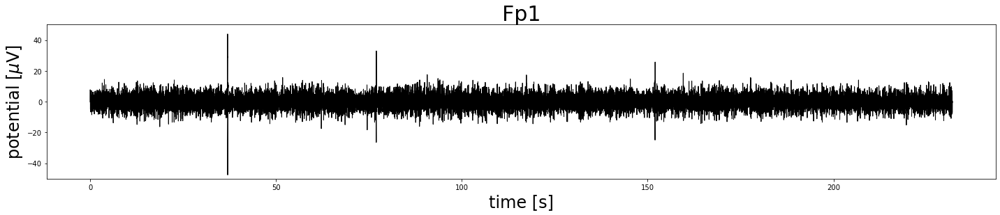

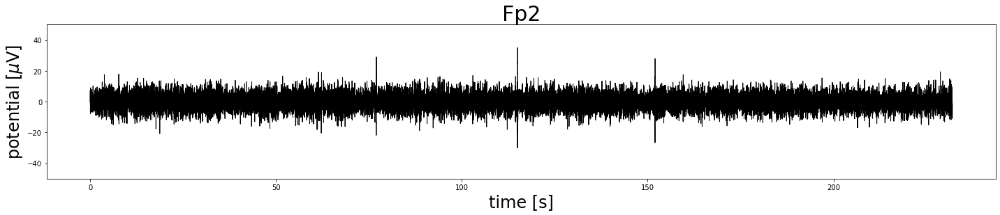

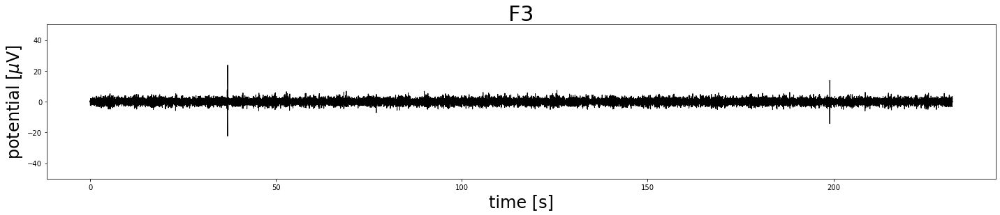

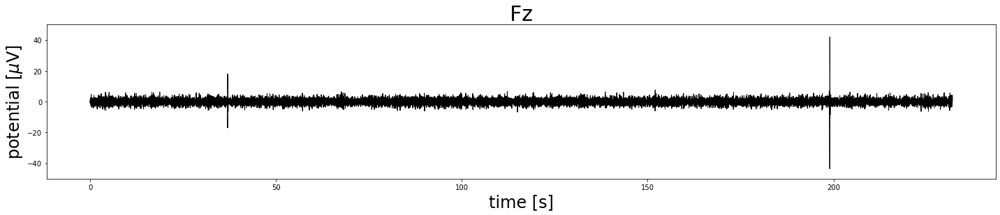

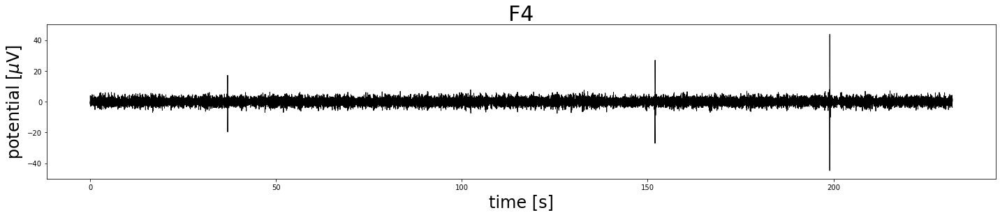

...

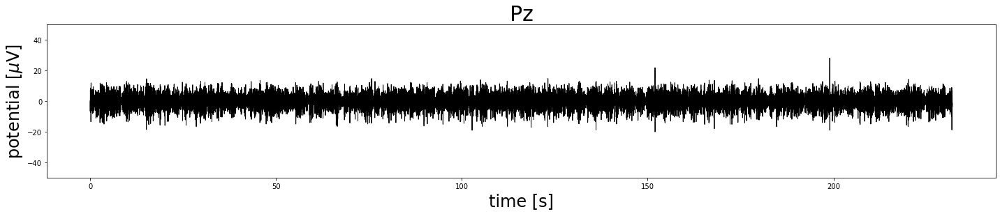

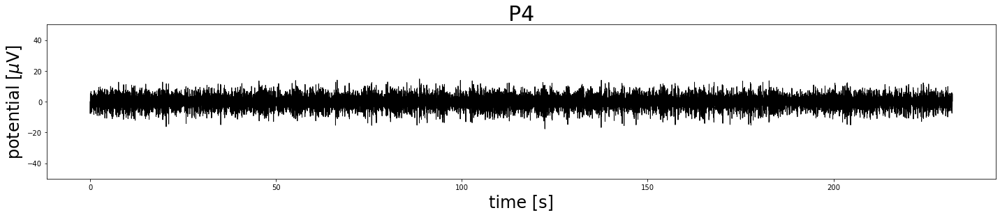

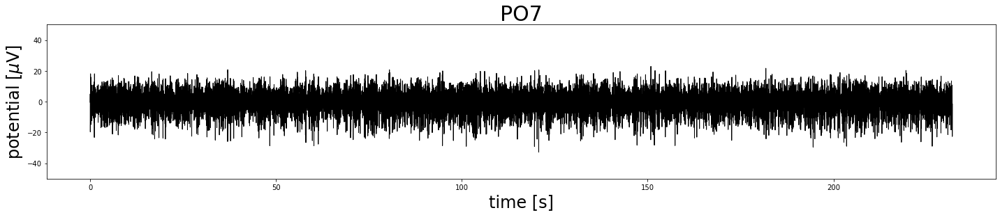

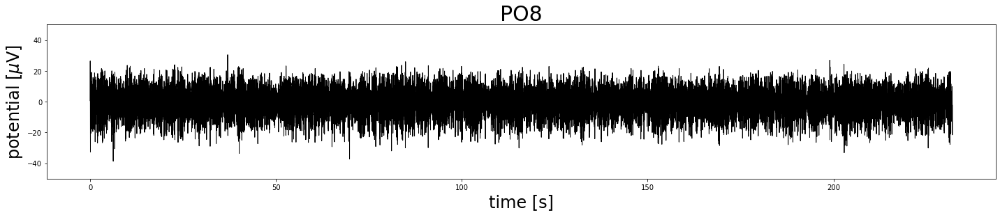

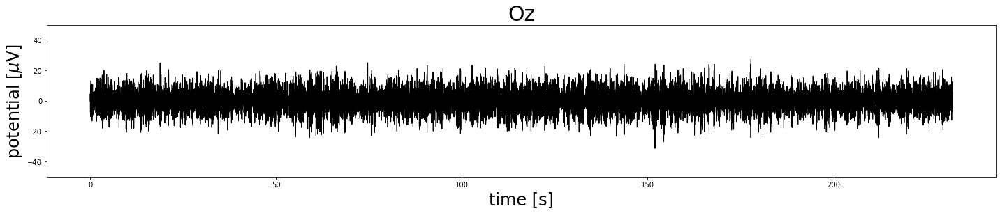

Kolor zielony - początek nagrania, czerwony - koniec nagrania
Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania


In [29]:
multi_plot(data=danel, fs=fs,ymin=-50, ymax=50, dataframe= timing, chs=chs, markery = False)

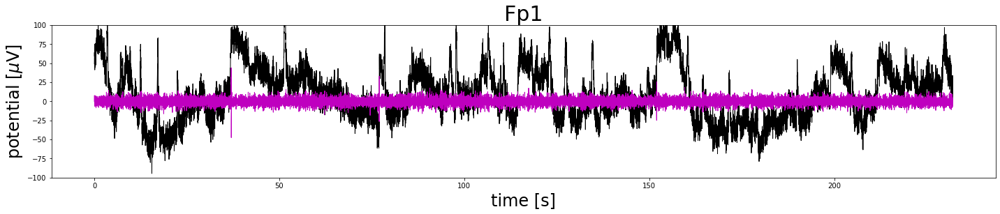

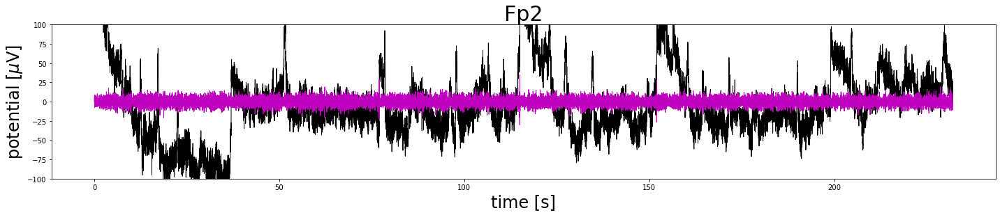

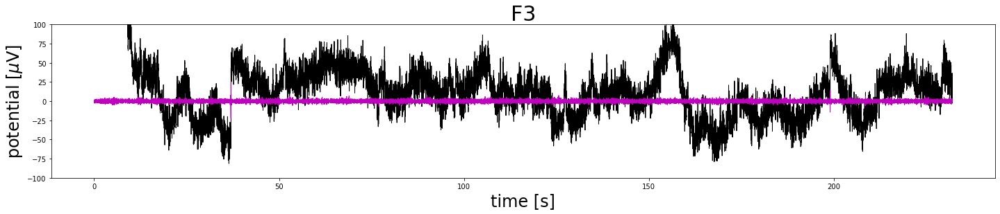

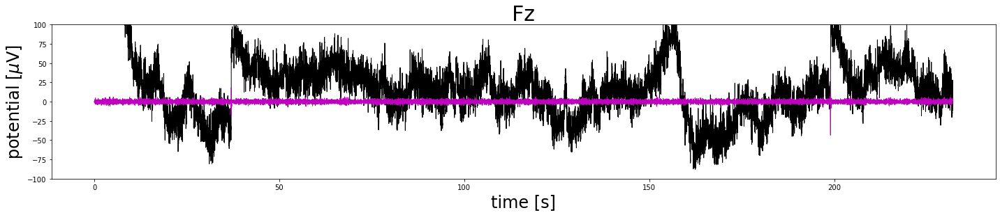

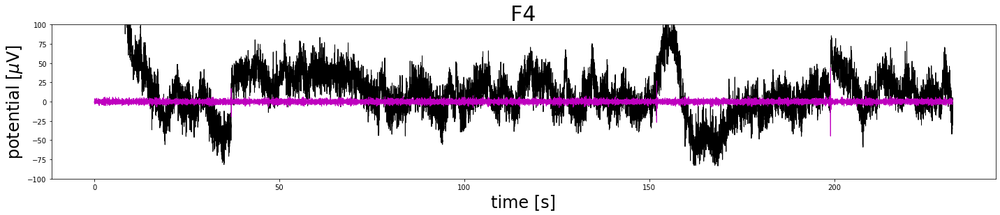

...

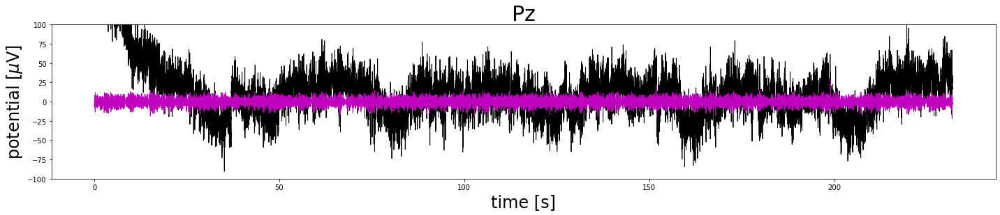

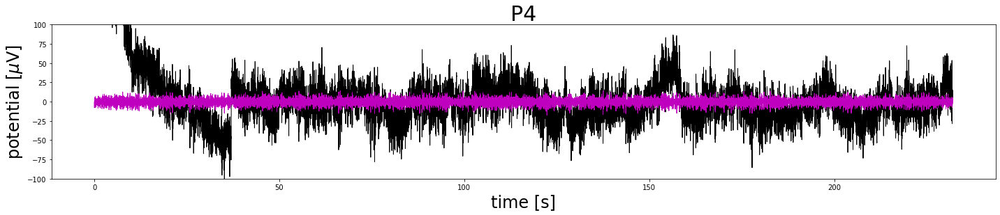

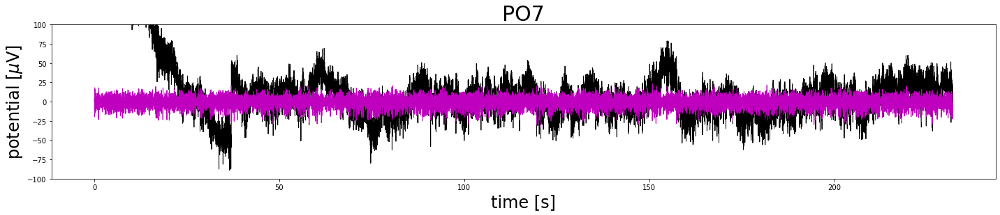

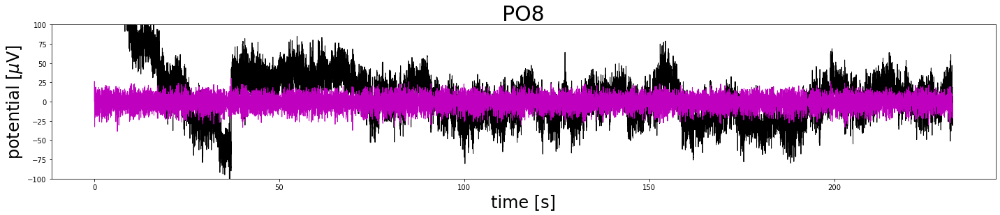

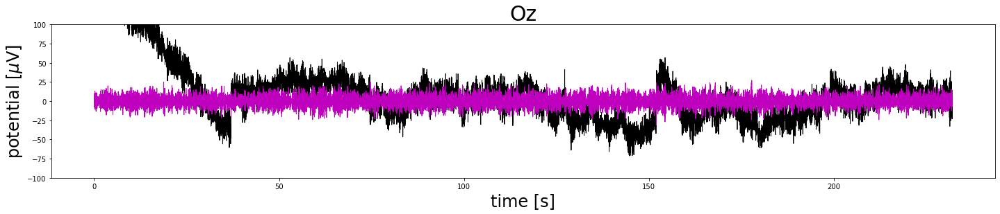

Stats


,Electrode,Mean_Before,Mean_After,Std_Before,Std_After,Var_Before,Var_After
0,Fp1,9.211634,4.502146e-17,34.374766,4.399132,1181.624553,19.352363
1,Fp2,-4.072462,1.797796e-16,44.856731,4.902015,2012.126304,24.029747
2,F3,16.739698,1.618629e-17,45.831154,1.613940,2100.494657,2.604801
3,Fz,20.508838,-4.434767e-17,45.964371,1.807879,2112.723394,3.268427
4,F4,17.144652,-1.316954e-18,45.618351,2.038366,2081.033912,4.154935
5,FC5,10.687843,-4.419453e-17,39.993745,2.784692,1599.499675,7.754511
6,FC1,14.181987,8.713337e-17,46.778856,2.038495,2188.261415,4.155462
7,FCz,22.305084,-3.598654e-18,44.547859,2.311690,1984.511730,5.343913
8,FC2,-4.170578,1.326142e-17,102.274120,3.819298,10459.995548,14.587037
9,FC6,12.455275,6.570223e-17,49.871296,2.396579,2487.146148,5.743592


In [73]:
signal_stats(data1=datal, data2=danel, fs=fs,ymin=-100, ymax=100, dataframe= timing, chs=chs, markery = False)

Wybierz metodę klasteryzacji spośród [kmeans, kmedoids, pca, ica]
Except = kmeans
Podaj metodę klasteryzacji: kmeans
[+] Data format for clustering [GFP peaks, channels]: 6354 x 30

[+] Clustering algorithm: mod. K-MEANS.
	K-means run 1/5 converged after 35 iterations.
	K-means run 2/5 converged after 19 iterations.
	K-means run 3/5 converged after 42 iterations.
	K-means run 4/5 converged after 42 iterations.
	K-means run 5/5 converged after 105 iterations.
[+] Computation time: 1.42 sec

[+] Microstate back-fitting:
data_norm:  (58000, 30)
data_cluster_norm:  (6354, 30)
maps:  (4, 30)

[+] Global explained variance GEV = 0.472
GEV_0: 0.094
GEV_1: 0.060
GEV_2: 0.057
GEV_3: 0.261


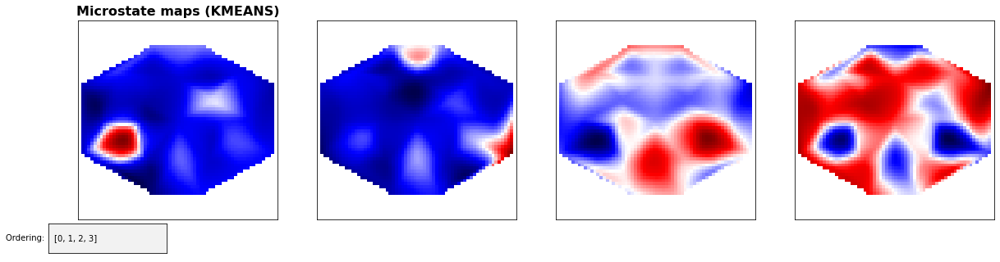

Re-ordered labels: 0, 1, 2, 3


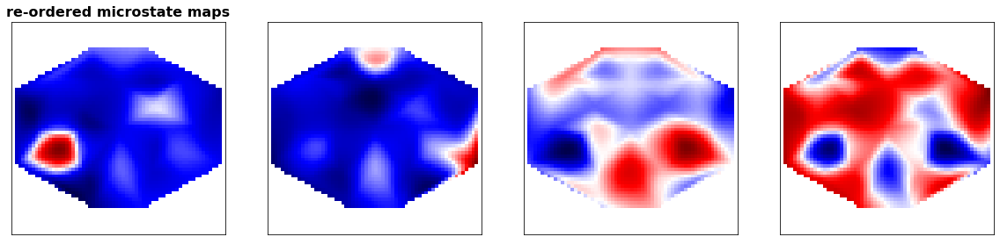

In [30]:
maps, x, gfp_peaks, gev = make_clusters(data=danel, fs=fs, chs=chs)

In [31]:
Stochastic_Matrix(x, 4)

,0,1,2,3
0,0.929020,0.020778,0.020290,0.029912
1,0.028342,0.917789,0.024824,0.029045
2,0.026336,0.024076,0.917944,0.031643
3,0.019846,0.011729,0.012622,0.955803


# Analiza sygnału ze słuchania datai

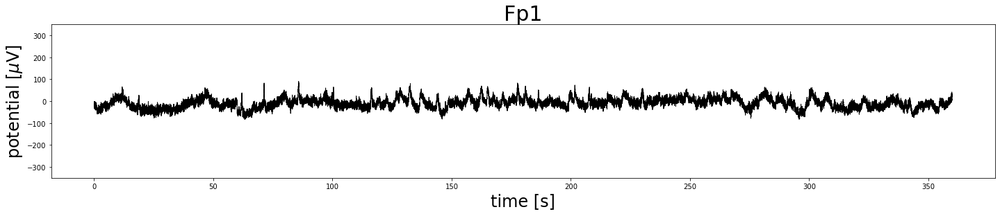

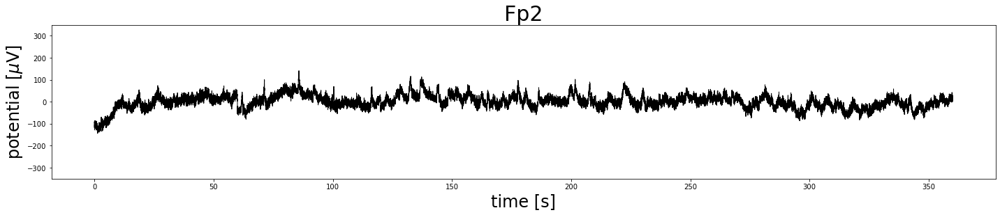

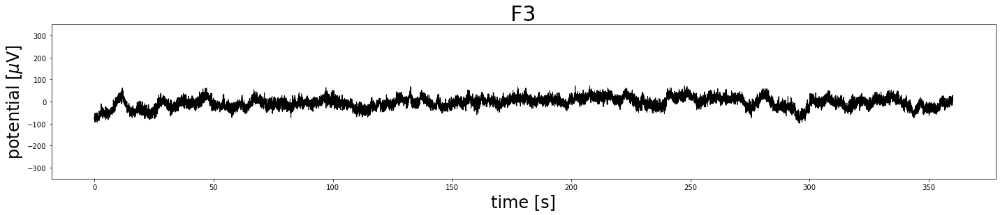

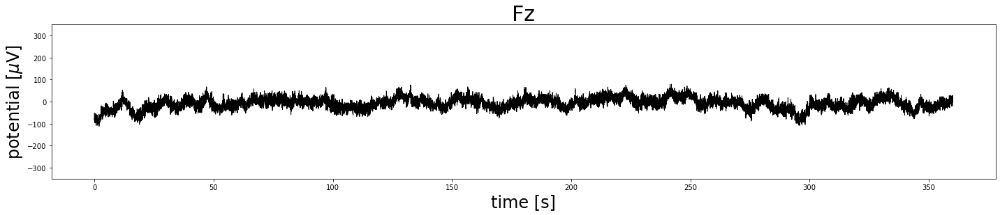

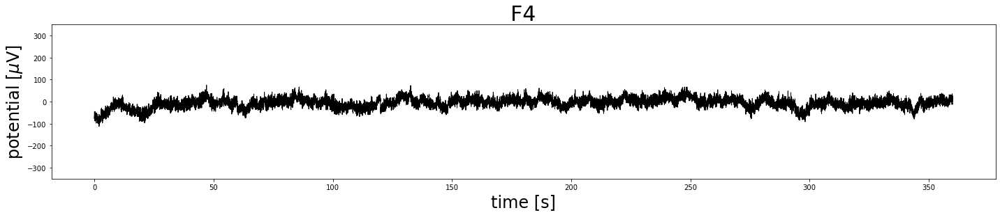

...

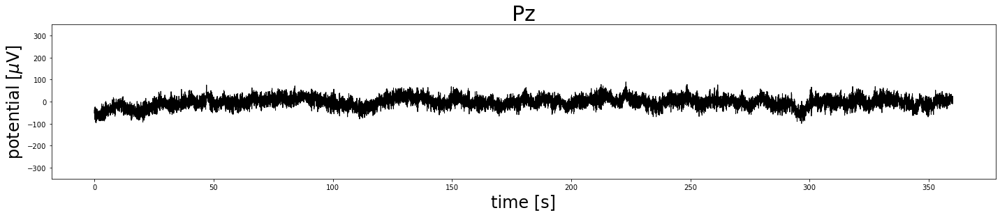

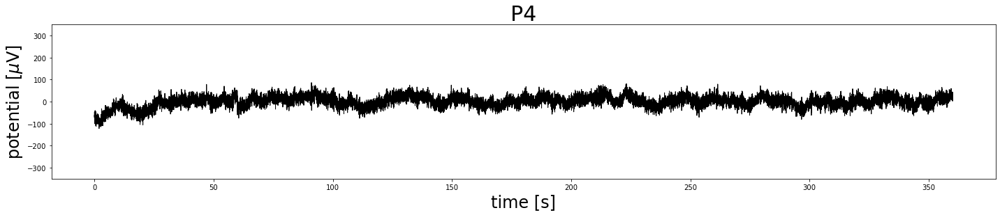

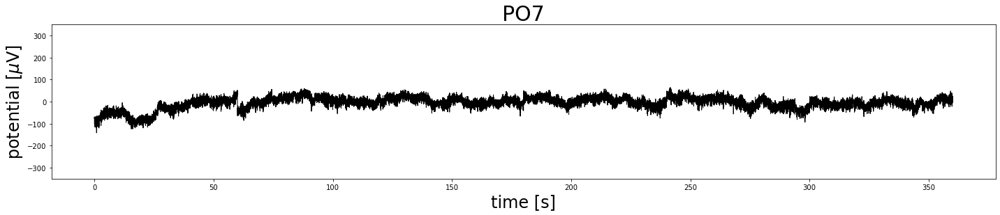

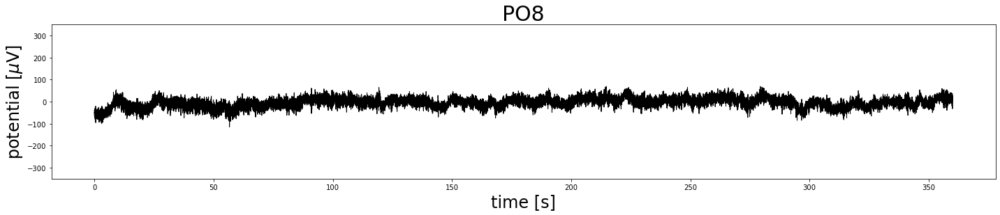

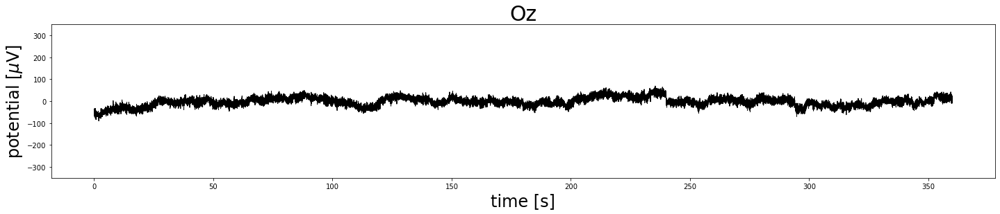

Kolor zielony - początek nagrania, czerwony - koniec nagrania
Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania


In [32]:
multi_plot(data=datai, fs=fs,ymin=-350, ymax=350, dataframe= timing, chs=chs, markery = False)

Filter used: Butterworth by dr. Wegner.
Filter used: Hjorth by dr. Jasik.
Filter used: mean_filter by me.


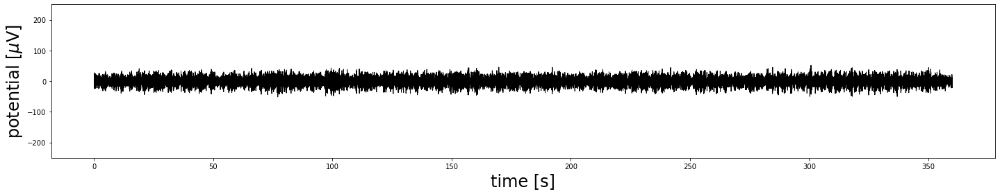

Kolor zielony - początek nagrania, czerwony - koniec nagrania
Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania


In [33]:
danei, pca = data_filter(data = datai, dataframe= timing, fs=fs, chs = chs, bp = "wegner", hjorth = True, mean = True, markery = False)

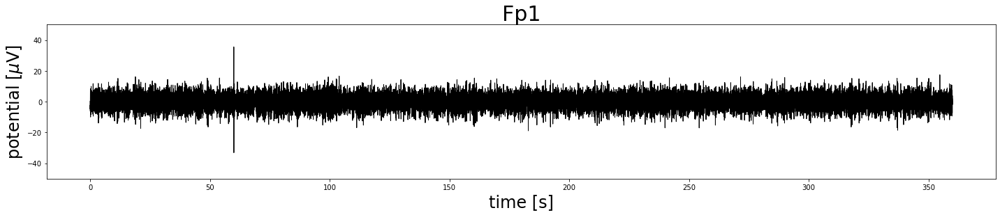

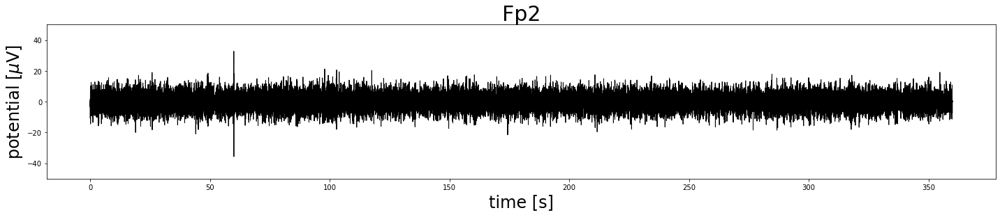

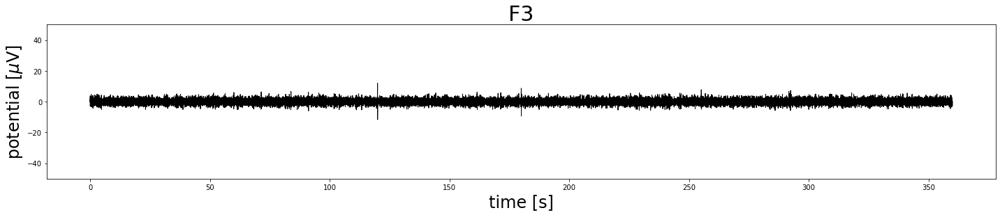

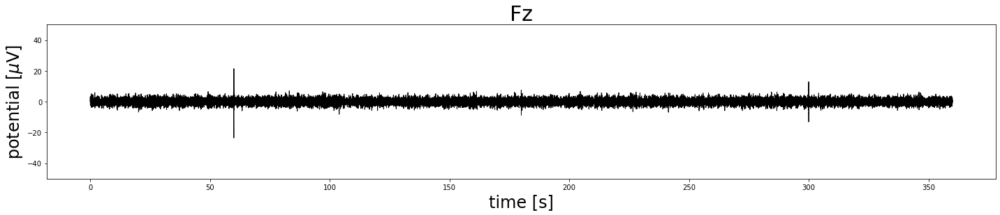

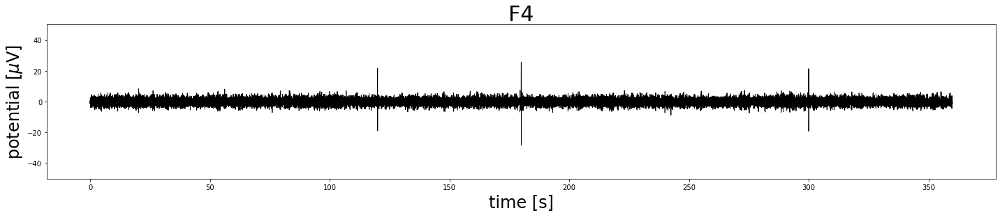

...

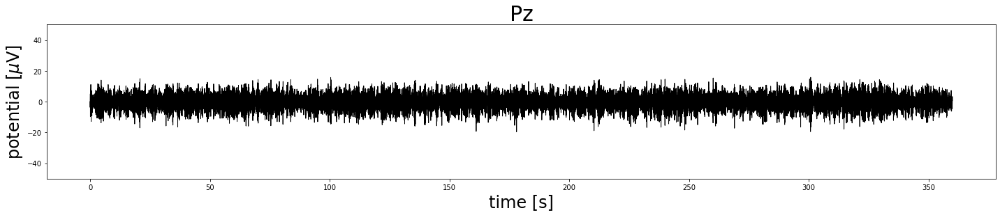

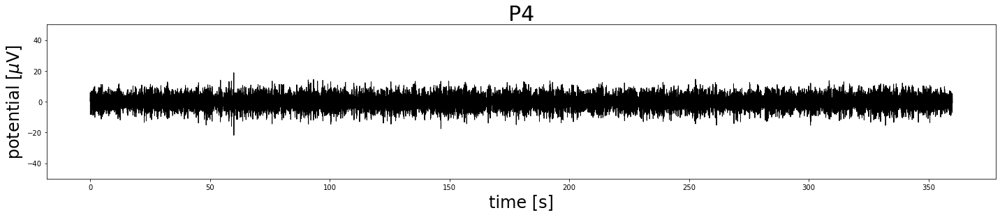

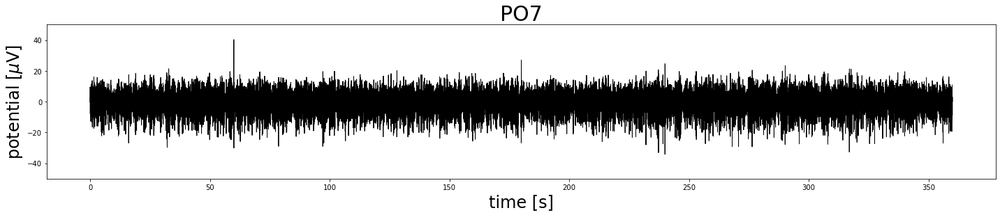

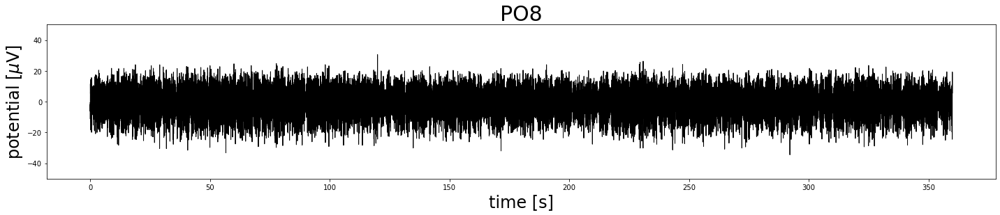

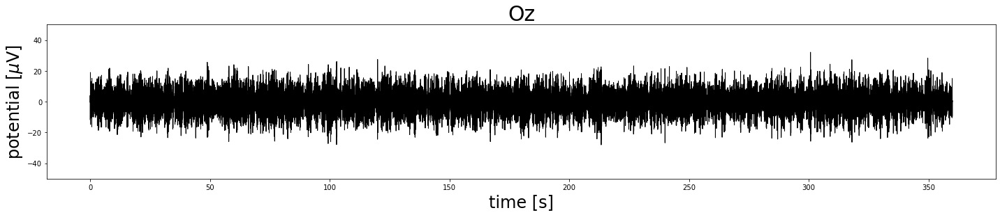

Kolor zielony - początek nagrania, czerwony - koniec nagrania
Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania


In [34]:
multi_plot(data=danei, fs=fs,ymin=-50, ymax=50, dataframe= timing, chs=chs, markery = False)

Wybierz metodę klasteryzacji spośród [kmeans, kmedoids, pca, ica]
Except = kmeans
Podaj metodę klasteryzacji: kmeans
[+] Data format for clustering [GFP peaks, channels]: 9548 x 30

[+] Clustering algorithm: mod. K-MEANS.
	K-means run 1/5 converged after 28 iterations.
	K-means run 2/5 converged after 54 iterations.
	K-means run 3/5 converged after 23 iterations.
	K-means run 4/5 converged after 85 iterations.
	K-means run 5/5 converged after 87 iterations.
[+] Computation time: 2.33 sec

[+] Microstate back-fitting:
data_norm:  (90000, 30)
data_cluster_norm:  (9548, 30)
maps:  (4, 30)

[+] Global explained variance GEV = 0.512
GEV_0: 0.205
GEV_1: 0.160
GEV_2: 0.068
GEV_3: 0.079


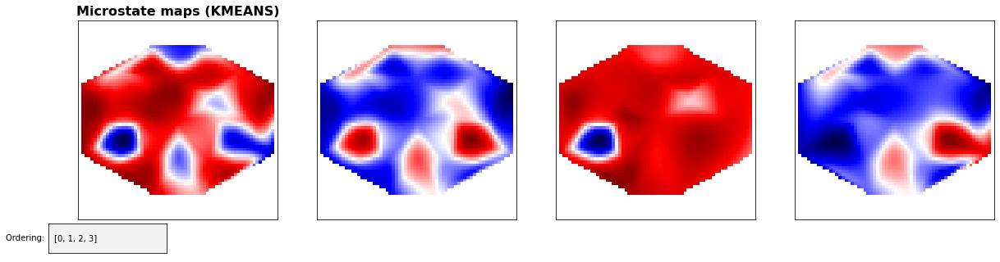

Re-ordered labels: 0, 1, 2, 3


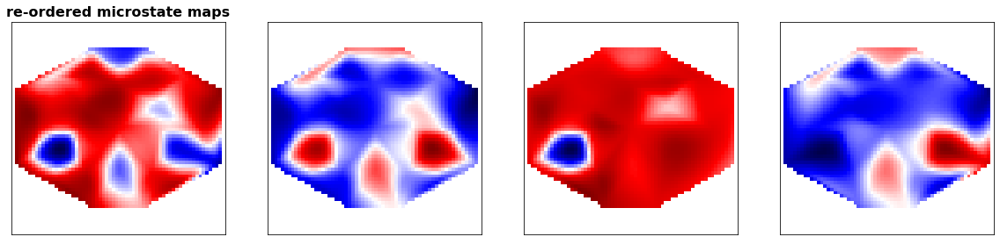

In [35]:
maps, x, gfp_peaks, gev = make_clusters(data=danei, fs=fs, chs=chs)

In [36]:
Stochastic_Matrix(x, 4)

,0,1,2,3
0,0.947535,0.019844,0.019879,0.012742
1,0.022789,0.945741,0.016963,0.014506
2,0.027056,0.022778,0.921933,0.028232
3,0.024565,0.021508,0.026641,0.927286


# Analiza wyczyszczonego całego sygnału

Filter used: Butterworth by dr. Wegner.
Filter used: Hjorth by dr. Jasik.
Filter used: mean_filter by me.


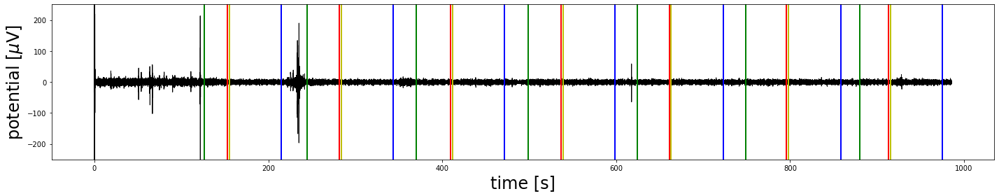

Kolor zielony - początek nagrania, czerwony - koniec nagrania
Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania


In [37]:
dane, pca = data_filter(data = data_raw, dataframe= timing, fs=fs, chs =  chs, bp = "wegner", hjorth = True, mean = True)

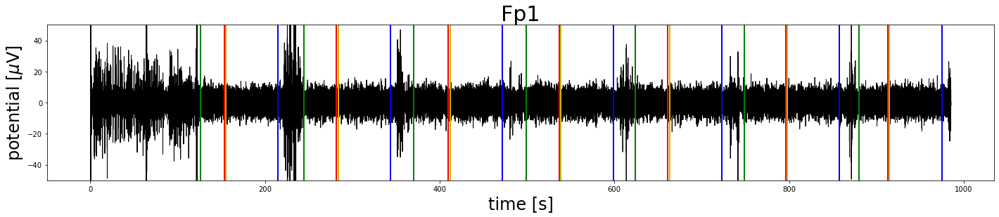

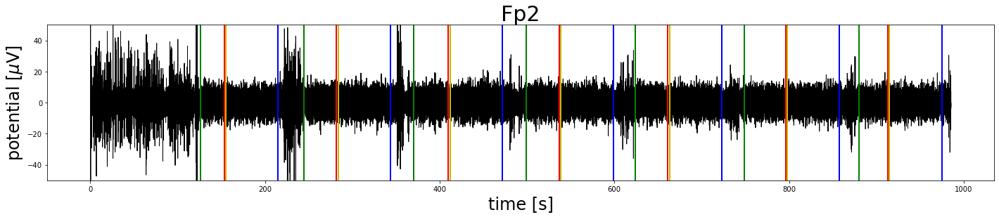

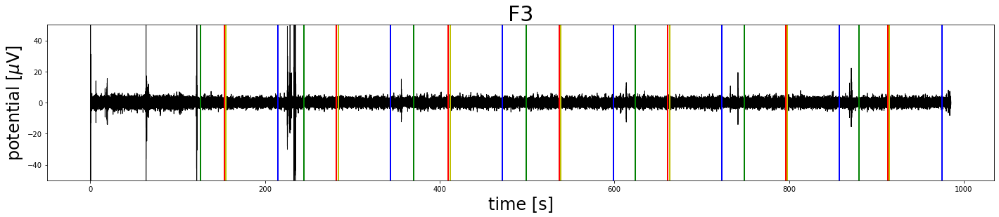

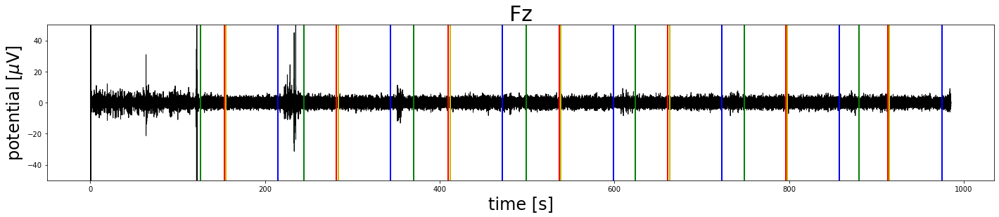

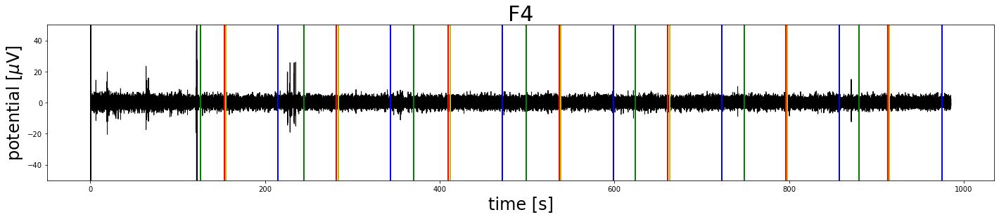

...

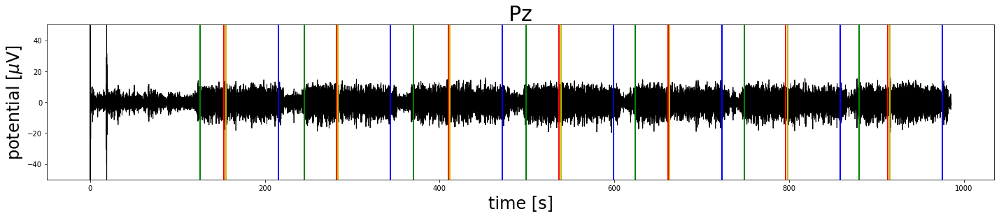

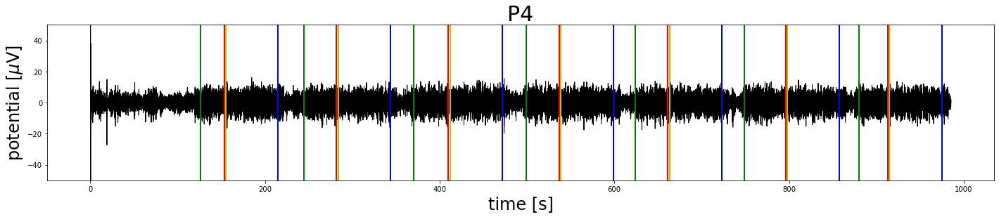

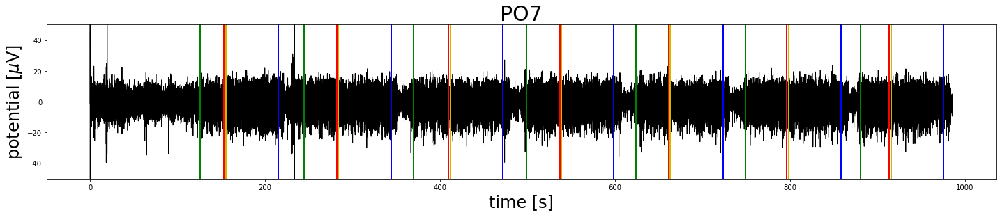

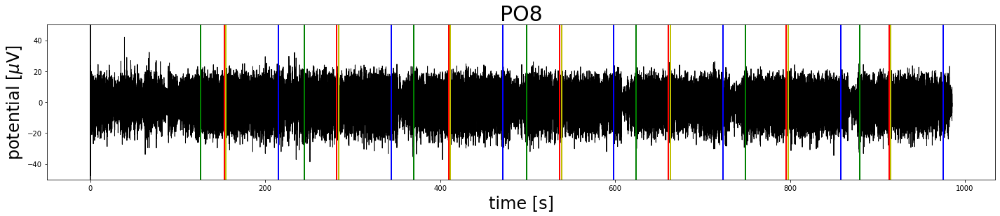

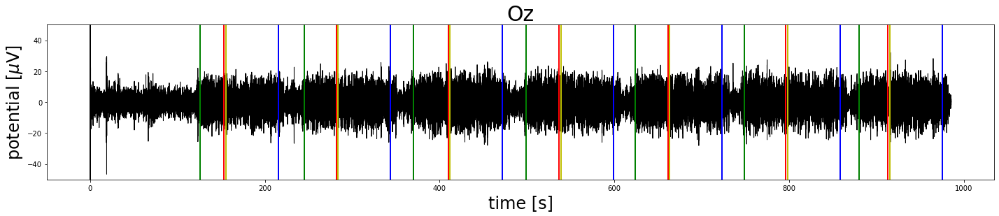

Kolor zielony - początek nagrania, czerwony - koniec nagrania
Żółty - 2 sekundy przerwy, niebieski - koniec wyobrażania


In [38]:
multi_plot(data=dane, fs=fs,ymin=-50, ymax=50, dataframe= timing, chs=chs)

Wybierz metodę klasteryzacji spośród [kmeans, kmedoids, pca, ica]
Except = kmeans
Podaj metodę klasteryzacji: kmeans
[+] Data format for clustering [GFP peaks, channels]: 30666 x 30

[+] Clustering algorithm: mod. K-MEANS.
	K-means run 1/5 converged after 9 iterations.
	K-means run 2/5 converged after 10 iterations.
	K-means run 3/5 converged after 7 iterations.
	K-means run 4/5 converged after 8 iterations.
	K-means run 5/5 converged after 6 iterations.
[+] Computation time: 1.60 sec

[+] Microstate back-fitting:
data_norm:  (246352, 30)
data_cluster_norm:  (30666, 30)
maps:  (4, 30)

[+] Global explained variance GEV = 0.963
GEV_0: 0.026
GEV_1: 0.913
GEV_2: 0.008
GEV_3: 0.017


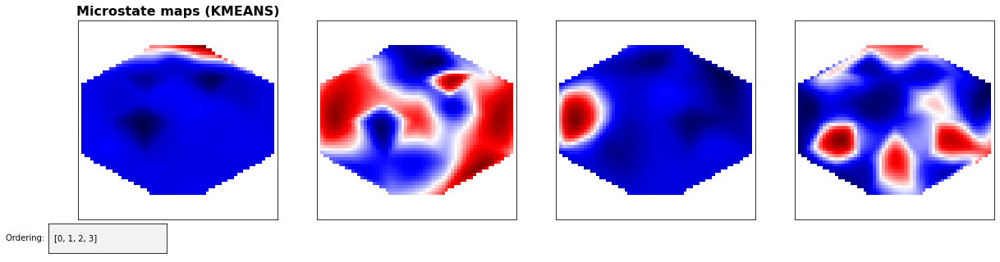

Re-ordered labels: 0, 1, 2, 3


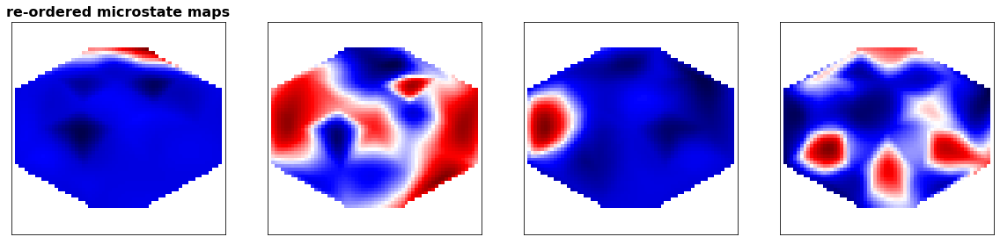

In [39]:
maps, x, gfp_peaks, gev = make_clusters(data=dane, fs=fs, chs=chs)


Empirical symbol distribution (RTT):

p_0 = 0.181
p_1 = 0.035
p_2 = 0.064
p_3 = 0.720

Empirical transition matrix:

|0.9080.0080.0110.073|
|0.0460.8510.0140.090|
|0.0330.0070.8870.073|
|0.0180.0050.0070.971|

GFP peaks per sec.: 31.12

Global explained variance (GEV) per map:
GEV(ms-0) = 0.03
GEV(ms-1) = 0.91
GEV(ms-2) = 0.01
GEV(ms-3) = 0.02

total GEV: 0.963

Empirical entropy H = 0.84 (max. entropy: 1.39)


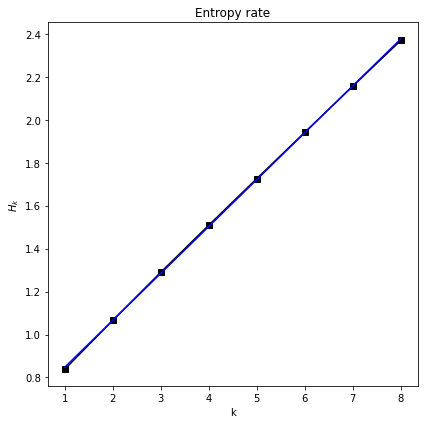


Empirical entropy rate h = 0.22
Theoretical MC entropy rate h = 0.23
ZERO-ORDER MARKOVIANITY:
p: 0.00e+00 | t: 300563.019 | df: 9.0

FIRST-ORDER MARKOVIANITY:
p: 0.00e+00 | t: 2039.316 | df: 36.0

SECOND-ORDER MARKOVIANITY:
p: 0.00e+00 | t: 2265.731 | df: 144.0

GEOMETRIC DISTRIBUTION of lifetimes:


Testing the distribution of symbol # 0
p: 0.00e+00 | t: 3055.838 | df: 283.0
G-test (log-likelihood) p: 5.54e-201, g: 1703.112, df: 283.0
G-test (Pearson Chi2) p: 3.21e-148, g: 1406.433, df: 283.0

Testing the distribution of symbol # 1
p: 1.88e-175 | t: 1390.136 | df: 204.0
G-test (log-likelihood) p: 1.56e-69, g: 787.960, df: 204.0
G-test (Pearson Chi2) p: 4.13e-47, g: 644.156, df: 204.0

Testing the distribution of symbol # 2
p: 4.17e-290 | t: 1781.256 | df: 126.0
G-test (log-likelihood) p: 2.07e-135, g: 997.020, df: 126.0
G-test (Pearson Chi2) p: 1.56e-103, g: 827.115, df: 126.0

Testing the distribution of symbol # 3
p: 0.00e+00 | t: 3256.791 | df: 664.0
G-test (log-likelihood) p: 1.4

In [40]:
stats(x = x, gfp_peaks = gfp_peaks, fs = fs)

In [41]:
Stochastic_Matrix(x, 4)

,0,1,2,3
0,0.908295,0.008196,0.010794,0.072715
1,0.045688,0.851166,0.013520,0.089627
2,0.032534,0.007081,0.887025,0.073361
3,0.018000,0.004503,0.006611,0.970886


# Done

0. Prezentacja - studia
1. Dzielenie na eksperymenty.
2. Numerowanie elektrod na wykresach, możliwość wyłączenia znaczników.
3. Usunięcie średniej.
4. ICA przed filtrowaniem.
5. Analiza dla eksperymentów.
6. Policzenie podstawowych statystyk dla wartości sygnału przed i po wyczyszczeniu.

# Następnie

0. Funkcja do rysowania sygnałów dla pojedynczych elektrod. - ewentualnie -
1. Porównywanie metod klasteryzacji między sobą.
2. Badanie podobieństw map
3. Stworzenie szeregu czasowego map mikrostanów
4. Badanie szeregu czasowego

# Pytania

1. Kiedy mean filter?